# Interpretability of Classifier Chain (Foodtruck Dataset)

In [1]:
from IPython.display import display, HTML, Image

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import copy
import random

from sklearn.ensemble import RandomForestClassifier
from sklearn.utils.validation import check_X_y, check_array, check_is_fitted
from sklearn.model_selection import train_test_split

from sklearn.metrics import make_scorer
from sklearn import metrics

# to avoid future warnings for sklearn
import warnings
warnings.filterwarnings("ignore")

## Import the dataset

In [2]:
# Read the CSV file
dataset = pd.read_csv('foodtruck.csv')
print("Dataset.shape: " + str(dataset.shape))

# split the features-X and class labels-y
X = dataset.iloc[:, :-12]
y = dataset.iloc[:, -12:]

print("X.shape: " + str(X.shape))
display(X.head())
print("y.shape: " + str(y.shape))
display(y.head())
print("Descriptive stats:")
X.describe()

Dataset.shape: (407, 33)
X.shape: (407, 21)


,frequency,time,expenses,motivation,taste,hygiene,menu,presentation,attendance,ingredients,...,takeaway,variation,stop.strucks,schedule,gender,age.group,scholarity,average.income,has.work,marital.status
0,2,1,30,1,5,4,4,3,4,4,...,3,3,2,2,1,2,1.5,4,0,1
1,0,1,20,2,5,2,4,4,4,4,...,2,3,1,4,0,3,2.0,5,1,0
2,1,2,15,2,5,2,2,5,3,5,...,2,2,2,1,1,2,1.5,4,1,1
3,0,3,40,1,5,5,4,3,4,4,...,4,5,1,1,1,3,2.0,6,1,1
4,0,1,15,4,5,4,2,3,4,4,...,3,4,1,1,1,2,1.5,4,1,1


y.shape: (407, 12)


,street_food,gourmet,italian_food,brazilian_food,mexican_food,chinese_food,japanese_food,arabic_food,snacks,healthy_food,fitness_food,sweets_desserts
0,1,0,0,0,0,0,0,0,0,0,0,1
1,1,0,1,0,1,0,0,0,0,0,0,1
2,1,0,0,1,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0,0


Descriptive stats:


,frequency,time,expenses,motivation,taste,hygiene,menu,presentation,attendance,ingredients,...,takeaway,variation,stop.strucks,schedule,gender,age.group,scholarity,average.income,has.work,marital.status
count,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,...,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000
mean,0.761671,1.918919,21.486486,2.469287,4.771499,4.651106,3.773956,4.272727,4.535627,4.481572,...,2.732187,3.420147,2.690418,2.663391,0.481572,2.358722,1.640049,2.958231,0.511057,0.867322
std,0.987461,1.423176,7.247503,1.314345,0.595032,0.699150,1.097696,0.877647,0.724711,0.799649,...,0.982367,1.070374,1.283653,1.356325,0.500275,1.412145,0.907029,1.569640,0.500493,0.367509
min,0.000000,1.000000,15.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000
25%,0.000000,1.000000,15.000000,1.000000,5.000000,4.000000,3.000000,4.000000,4.000000,4.000000,...,2.000000,3.000000,2.000000,1.000000,0.000000,2.000000,1.000000,2.000000,0.000000,1.000000
50%,0.000000,1.000000,20.000000,2.000000,5.000000,5.000000,4.000000,4.000000,5.000000,5.000000,...,3.000000,4.000000,3.000000,3.000000,0.000000,2.000000,1.500000,3.000000,1.000000,1.000000
75%,1.000000,2.000000,20.000000,4.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,...,3.000000,4.000000,4.000000,4.000000,1.000000,3.000000,2.000000,4.000000,1.000000,1.000000
max,4.000000,5.000000,50.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,...,5.000000,5.000000,5.000000,5.000000,1.000000,8.000000,5.000000,6.000000,1.000000,2.000000


## Check the shape of data

In [3]:
# Normalise the data
X = (X-X.min())/(X.max()-X.min())

# split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, train_size=0.7)

print("X_train.shape: " + str(X_train.shape))
print("X_test.shape: " + str(X_test.shape))
print("y_train.shape: " + str(y_train.shape))
print("y_test.shape: " + str(y_test.shape))

X_train.shape: (284, 21)
X_test.shape: (123, 21)
y_train.shape: (284, 12)
y_test.shape: (123, 12)


## Import Classifier Chain

In [4]:
from sklearn.multioutput import ClassifierChain

## Fit the classifier(with RandomForestClassifier)

In [5]:
chain_clf = ClassifierChain(RandomForestClassifier(criterion='entropy'), order='random', random_state=0)
chain_clf.fit(X_train, y_train)

ClassifierChain(base_estimator=RandomForestClassifier(criterion='entropy'),
                order='random', random_state=0)

## Prediction

In [6]:
pred_chain=chain_clf.predict(X_test)

In [7]:
print(type(pred_chain))

<class 'numpy.ndarray'>


In [8]:
#Get values of prediction
pred_chain_df=pd.DataFrame(pred_chain, columns=y.columns.tolist())
pred_chain_df

,street_food,gourmet,italian_food,brazilian_food,mexican_food,chinese_food,japanese_food,arabic_food,snacks,healthy_food,fitness_food,sweets_desserts
0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
118,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
119,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
120,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
121,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


## predict_proba function

In [9]:
pred_proba_chain=chain_clf.predict_proba(X_test)
print(type(pred_proba_chain))

<class 'numpy.ndarray'>


In [10]:
#Get values of predict_proba function
pred_proba_chain_df=pd.DataFrame(pred_proba_chain, columns=y.columns.tolist())
pred_proba_chain_df

,street_food,gourmet,italian_food,brazilian_food,mexican_food,chinese_food,japanese_food,arabic_food,snacks,healthy_food,fitness_food,sweets_desserts
0,0.82,0.53,0.06,0.05,0.11,0.00,0.14,0.01,0.02,0.08,0.00,0.72
1,0.82,0.36,0.17,0.24,0.32,0.01,0.29,0.03,0.12,0.22,0.08,0.56
2,0.84,0.31,0.14,0.06,0.15,0.00,0.13,0.02,0.38,0.07,0.21,0.60
3,0.83,0.09,0.06,0.09,0.10,0.00,0.07,0.02,0.33,0.01,0.09,0.42
4,0.70,0.06,0.03,0.17,0.11,0.00,0.12,0.03,0.29,0.08,0.08,0.33
...,...,...,...,...,...,...,...,...,...,...,...,...
118,0.55,0.68,0.21,0.03,0.07,0.01,0.10,0.07,0.04,0.03,0.02,0.60
119,0.86,0.13,0.11,0.15,0.03,0.00,0.02,0.01,0.13,0.01,0.10,0.39
120,0.55,0.25,0.00,0.13,0.04,0.00,0.28,0.03,0.12,0.07,0.05,0.35
121,0.78,0.49,0.18,0.05,0.04,0.01,0.11,0.01,0.32,0.08,0.08,0.55


## Calculate multioutput precision and loss

In [11]:
# calculate multioutput precision and loss
from sklearn.metrics import label_ranking_average_precision_score, label_ranking_loss

In [12]:
avg_precision = label_ranking_average_precision_score(y_test, pred_chain)
loss = label_ranking_loss(y_test, pred_chain)

In [13]:
# Get precision and loss
print('Average precision {0:.5f} and loss {1:.5f}'.format(avg_precision, loss))

Average precision 0.58718 and loss 0.47644


## Explain the model with SHAP

### Import SHAP

In [14]:
# Load ML Interpreting Models
import shap

# Initialize JS For Plot
shap.initjs()

### Build explainer(predict_proba function works)

In [15]:
explainer_chain = shap.KernelExplainer(chain_clf.predict_proba, X_train)

Using 284 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


## Local Interpretability

### Calculate SHAP values of Sample 1

In [16]:
shap_values = explainer_chain.shap_values(X_test.iloc[0,:])

#### Visualize the shap value, here is the explanation of X_test.iloc[0,:] about the first label "street_food"

In [17]:
shap.force_plot(explainer_chain.expected_value[0], shap_values[0], X_test.iloc[0,:])

#### Explanation of Sample 1 for the second label "gourmet"

In [18]:
shap.force_plot(explainer_chain.expected_value[1], shap_values[1], X_test.iloc[0,:])

#### Explanation of Sample 1 for the last label "sweets_desserts"

In [19]:
shap.force_plot(explainer_chain.expected_value[11], shap_values[11], X_test.iloc[0,:])

### Calculate SHAP values of Sample 2

In [20]:
shap_values = explainer_chain.shap_values(X_test.iloc[1,:])

#### Explanation of Sample 2 for the first label "street_food"

In [21]:
shap.force_plot(explainer_chain.expected_value[0], shap_values[0], X_test.iloc[1,:])

#### Explanation of Sample 2 for the second label "gourmet"

In [22]:
shap.force_plot(explainer_chain.expected_value[1], shap_values[1], X_test.iloc[1,:])

#### Explanation of Sample 2 for the last label "sweets_desserts"

In [23]:
shap.force_plot(explainer_chain.expected_value[11], shap_values[11], X_test.iloc[1,:])

#### Explanation of any Sample (location is X_test.iloc[x,:]) for n-th label 

In [24]:
#shap_values = explainer_BR.shap_values(X_test.iloc[n-1,:])
#shap.force_plot(explainer_BR.expected_value[n-1], shap_values[n-1], X_test.iloc[x,:])

## Global Interpretability of predict_proba function

To get the integral outlook of all samples, we use the K-Means Algorithm to summarize the data otherwise it wil take too much time (a few hours)to complete all the calculation. But on the other hand we will lose some accuracy.

In [25]:
# using kmeans
X_train_summary = shap.kmeans(X_train, 10)

### Build the explainer

In [26]:
explainer_chain = shap.KernelExplainer(chain_clf.predict_proba, X_train_summary)

### Get the KNN shap value of X_test

In [27]:
shap_values_KNN_test = explainer_chain.shap_values(X_test)

### Summerize the explanations of predictions about Label "street_food"

In [28]:
shap.force_plot(explainer_chain.expected_value[0], shap_values_KNN_test[0], X_test)

### Summerize the explanations of predictions about label "gourmet"

In [29]:
shap.force_plot(explainer_chain.expected_value[1], shap_values_KNN_test[1], X_test)

### Summerize the explanations of predictions about label "sweets_desserts"

In [30]:
shap.force_plot(explainer_chain.expected_value[11], shap_values_KNN_test[11], X_test)

### Summerize the explanations of predictions about label "italian_food"

In [31]:
shap.force_plot(explainer_chain.expected_value[2], shap_values_KNN_test[2], X_test)

### Summerize the explanations of predictions about label "brazilian_food"

In [32]:
shap.force_plot(explainer_chain.expected_value[3], shap_values_KNN_test[3], X_test)

### Summerize the explanations of predictions about the n-th Label

In [33]:
#shap.force_plot(explainer_BR.expected_value[n-1], shap_values_KNN_test[n-1], X_test)

## Bar chart of feature Importance

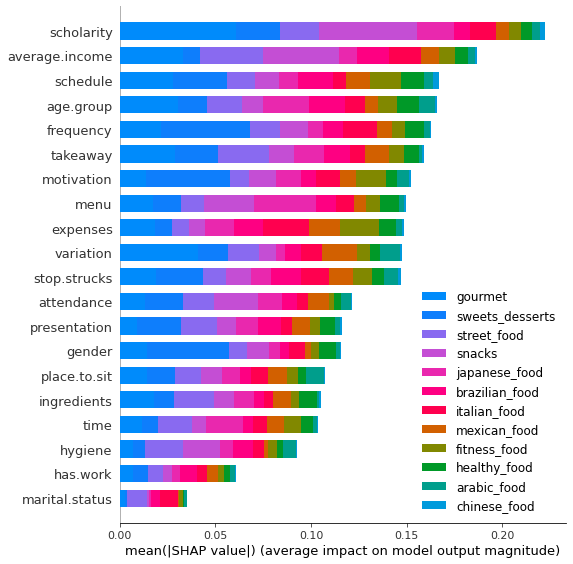

In [34]:
shap.summary_plot(shap_values_KNN_test, X, plot_type="bar",class_names = y.columns.tolist())

### Summarize the impact of all features over the entire dataset

From the bar chart we can know how the predictions of labels are most influenced by the specific features. For example, the feature "scholarity" has the most influences on the prediction about labels "gourmet" and "snacks". The feature "expenses" has the most influences on the prediction about label "fitness_food".

### summary_plot shows us how each feature impacts the labels.

#### How each feature impacts label "gourmet".

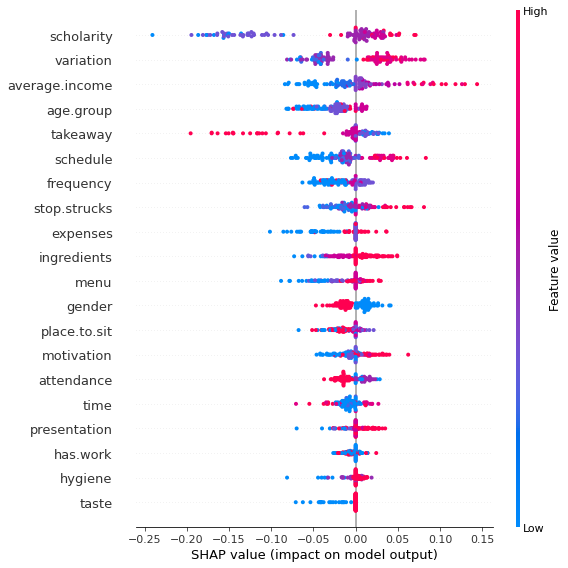

In [51]:
shap.summary_plot(shap_values_KNN_test[1], X_test)

#### How each feature impacts label "snacks".

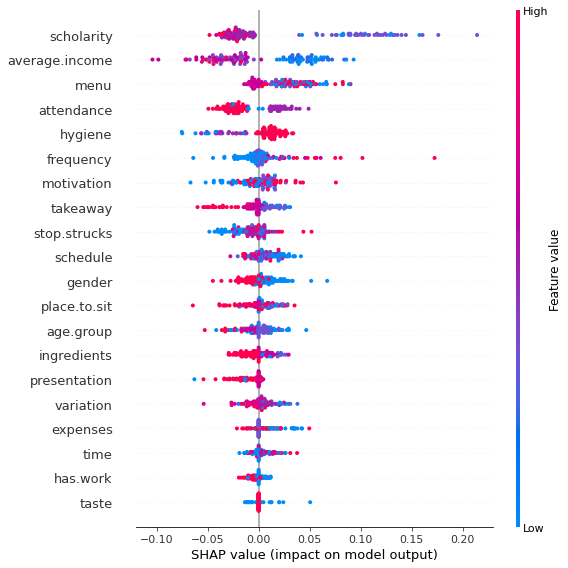

In [52]:
shap.summary_plot(shap_values_KNN_test[8], X_test)

#### How each feature impacts label "fitness_food".

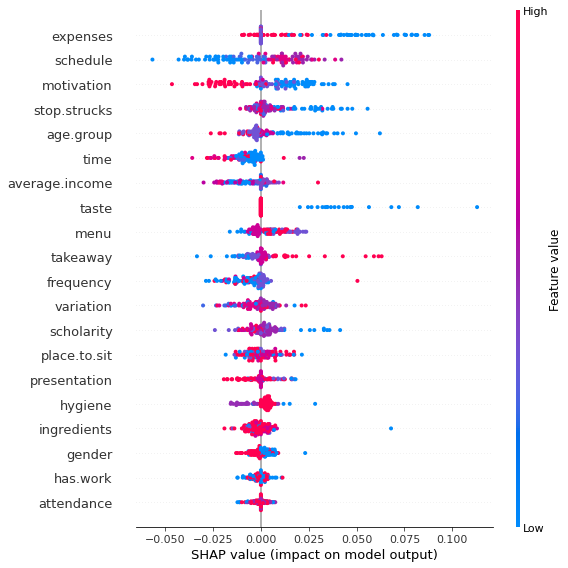

In [53]:
shap.summary_plot(shap_values_KNN_test[10], X_test)

### Examine how changes in a feature change the model's prediction

### We use dependence_plot.

### Feature "scholarity" on label "gourmet"

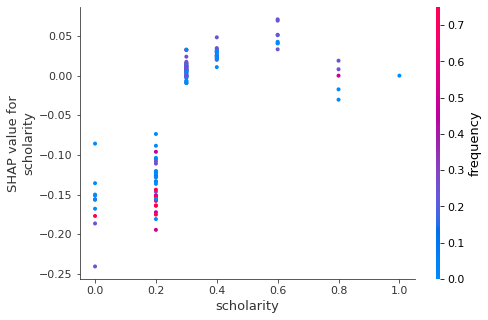

In [54]:
shap.dependence_plot("scholarity", shap_values_KNN_test[1], X_test)

### Feature "scholarity" on label "snacks"

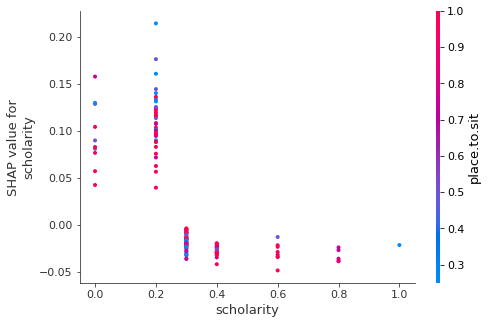

In [56]:
shap.dependence_plot("scholarity", shap_values_KNN_test[8], X_test)

### Feature "expenses" on label "fitness_food"

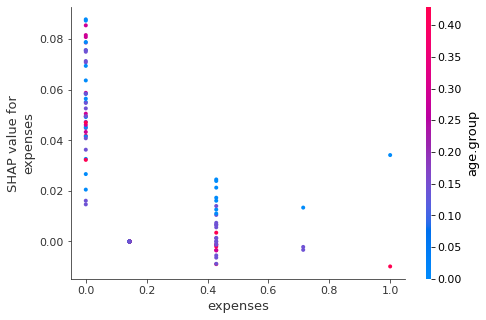

In [58]:
shap.dependence_plot("expenses", shap_values_KNN_test[10], X_test)

### The predict function of this classifier is also interpretable with SHAP.

### The next steps are similar to the previous explanation of the predict-proba function.

## Explain with LIME

### Import LIME

In [39]:
import lime
import lime.lime_tabular
from __future__ import print_function
np.random.seed(1)

### Explaination about predict_proba function

In [40]:
# Creating the Lime Explainer
# Be very careful in setting the order of the class names
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train.values,
    training_labels=y_train.values,
    feature_names=X_train.columns.tolist(),
    feature_selection="lasso_path",
    class_names=["street_food","gourmet","italian_food","brazilian_food","mexican_food","chinese_food","japanese_food","arabic_food","snacks","healthy_food","fitness_food","sweets_desserts"],
    discretize_continuous=True,
    discretizer="entropy",
)

In [41]:
#Now let's pick a sample case from our test set.
row = 1
exp = lime_explainer.explain_instance(X_test.iloc[row], chain_clf.predict_proba, num_features=21)
exp.show_in_notebook(show_table=True)

In [42]:
#Now let's pick a sample case from our test set.
row = 2
exp = lime_explainer.explain_instance(X_test.iloc[row], chain_clf.predict_proba, num_features=21)
exp.show_in_notebook(show_table=True)

In [43]:
#Now let's pick a sample case from our test set.
row = 100
exp = lime_explainer.explain_instance(X_test.iloc[row], chain_clf.predict_proba, num_features=21)
exp.show_in_notebook(show_table=True)

### Explaination about predict function

In [44]:
# Creating the Lime Explainer
# Be very careful in setting the order of the class names
lime_explainer2 = lime.lime_tabular.LimeTabularExplainer(
    X_train.values,
    training_labels=y_train.values,
    feature_names=X_train.columns.tolist(),
    feature_selection="lasso_path",
    class_names=["street_food","gourmet","italian_food","brazilian_food","mexican_food","chinese_food","japanese_food","arabic_food","snacks","healthy_food","fitness_food","sweets_desserts"],
    discretize_continuous=True,
    discretizer="entropy",
)

In [45]:
#Now let's pick a sample case from our test set.
row = 1
exp = lime_explainer2.explain_instance(X_test.iloc[row], chain_clf.predict, num_features=21)
exp.show_in_notebook(show_table=True)

In [46]:
#Now let's pick a sample case from our test set.
row = 2
exp = lime_explainer2.explain_instance(X_test.iloc[row], chain_clf.predict, num_features=21)
exp.show_in_notebook(show_table=True)

In [50]:
#Now let's pick a sample case from our test set.
row = 100
exp = lime_explainer2.explain_instance(X_test.iloc[row], chain_clf.predict, num_features=21)
exp.show_in_notebook(show_table=True)

## Explain with eli5(Permutation Feature Importance)

### Import eli5

In [47]:
import eli5
from eli5.sklearn import PermutationImportance

In [48]:
perms_chain = PermutationImportance(chain_clf).fit(X_test, y_test)

In [49]:
eli5.show_weights(perms_chain,top=21,feature_names = X.columns.tolist())

Weight,Feature
0.0341 ± 0.0260,motivation
0.0228 ± 0.0190,age.group
0.0179 ± 0.0190,expenses
0.0179 ± 0.0280,schedule
0.0179 ± 0.0260,variation
0.0179 ± 0.0347,menu
0.0146 ± 0.0122,has.work
0.0146 ± 0.0122,presentation
0.0130 ± 0.0221,frequency
0.0130 ± 0.0221,stop.strucks
